In [1]:
"""
Copyright 2021 Huawei Technologies Co., Ltd

CREATED:  2022-11-23 13:12:13
MODIFIED: 2022-11-23 10:48:45
"""

# -*- coding:utf-8 -*-
import cv2
import os
import sys
from src.model import preprocess
from src.postprocessing import postprocess
from PIL import Image


sys.path.append('../../Common/acllite')

from acllite_model import AclLiteModel
from acllite_resource import AclLiteResource
from constants import IMG_EXT


In [2]:
INPUT_DIR = './data/'
OUTPUT_DIR = './out/'

In [3]:
device_id = 0
model_path = './model/deeplab_513.om'

In [4]:
acl_resource = AclLiteResource(device_id)
acl_resource.init()
print('[Device] NPU Device id:',acl_resource.device_id)
model = AclLiteModel(model_path)

init resource stage:
Init resource success
[Device] NPU Device id: 0
Init model resource start...
[AclLiteModel] create model output dataset:
malloc output 0, size 22106196
Create model output dataset success
Init model resource success


In [5]:
images_list = [os.path.join(INPUT_DIR, img)
                   for img in os.listdir(INPUT_DIR)
                   if os.path.splitext(img)[1] in IMG_EXT]
print(images_list)
input_data = preprocess(images_list[0],model._model_desc)
result_list = model.execute([input_data,])

['./data/test.jpg']
model input size 1
input  0
model input dims ({'name': 'input_data', 'dimCount': 4, 'dims': [1, 3, 513, 513]}, 0)
model input datatype 0
model output size 1
output  0
model output dims ({'name': 'output_0_trans_Cast_343_0', 'dimCount': 4, 'dims': [1, 21, 513, 513]}, 0)
model output datatype 0
[Model] class Model init resource stage success


In [6]:
fig = postprocess(result_list, images_list[0], OUTPUT_DIR)

./mask/pic7.jpg dilate_mask_pic
./mask/pic15.jpg dilate_mask_pic
Image saved out path.


['./out/test.jpg']


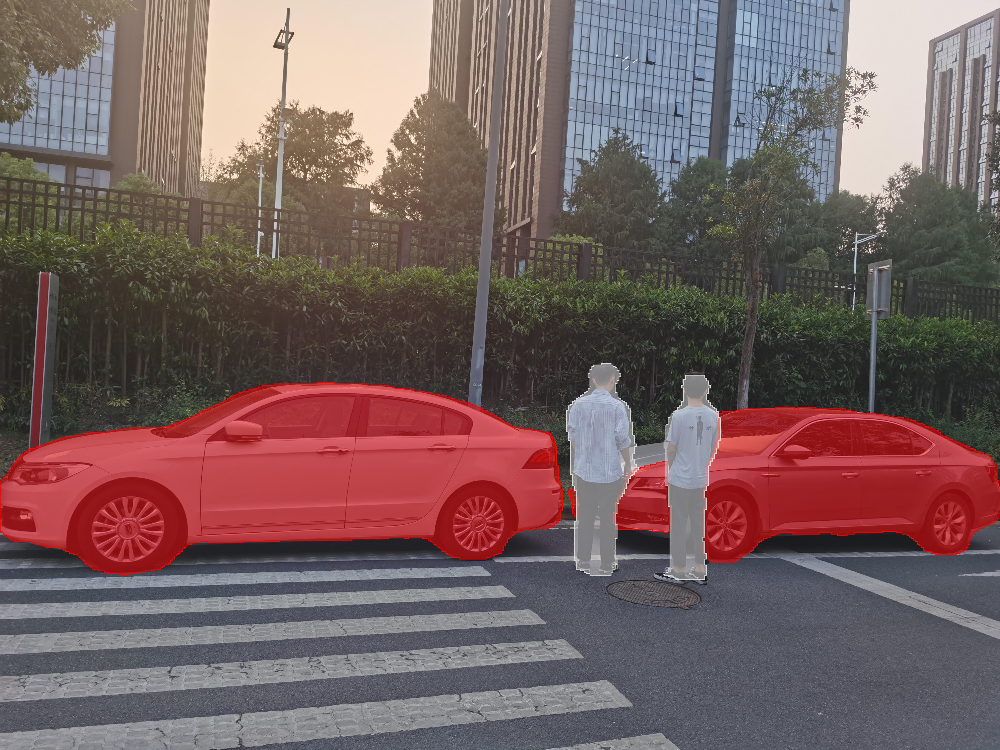

In [7]:
images_list = [os.path.join(OUTPUT_DIR, img)
                   for img in os.listdir(OUTPUT_DIR)
                   if os.path.splitext(img)[1] in IMG_EXT]
print(images_list)
output_img = cv2.imread(images_list[0])
res_img = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)
res_img_plw = Image.fromarray(res_img)

res_img_plw